In [1]:
import sys
sys.path.append("..")

import pandas as pd
import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ETL.common import execute_query

In [2]:
q = "SELECT * FROM houses_clean ORDER BY timestamp DESC"
df_raw = execute_query(q)

In [3]:
df = df_raw.copy()

In [4]:
loudness_df = gpd.read_file("2017_isofones_total_lden_mapa_estrategic_soroll_bcn.gpkg",
                     layer="2017_Isofones_Total_Lden_Mapa_Estrategic_Soroll_BCN")
loudness_df = loudness_df.to_crs(epsg=4326)
loudness_df = loudness_df.rename(columns={"Rang": "loudness"})

In [5]:
df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326")
df = df.sjoin(loudness_df, how="left")
df = df[df.columns.difference(["fid", "index_right"])]

In [6]:
cat_cols = ["active", "city", "type", "orientation", "age", "parking", "floor", 
            "elevator", "furniture", "state", "heating", "water_heating", 
            "formatted_address", "pets", "loudness"]
num_cols = ["price", "rooms", "bathrooms", "surface", "latitude", "longitude"]

plot_cols = cat_cols + num_cols

for c in cat_cols:
    df[c] = df[c].fillna("Null")
    if c == "age":
        df[c] = pd.Categorical(df[c], ["Null", "Menos de 1 año", "1 a 5 años", "5 a 10 años", "10 a 20 años", 
                                       "20 a 30 años", "30 a 50 años", "70 a 100 años", "+ 100 años"])
    elif c == "floor":
        df[c] = pd.Categorical(df[c], ["Null", "Sótano", "Otro", "Bajos", "Entresuelo", "1ª planta", "2ª planta",
                                       "3ª planta", "4ª planta", "5ª planta", "6ª planta", "7ª planta", 
                                       "8ª planta", "9ª planta", "10ª planta",  "11ª planta", "12ª planta",
                                       "13ª planta", "14ª planta", "A partir de la 15ª planta"])
    elif c == "orientation":
        df[c] = pd.Categorical(df[c], ["Null", "Este", "Noreste", "Norte", "Noroeste", "Oeste", "Suroeste", "Sur", "Sureste"])
    else:
        df[c] = pd.Categorical(df[c])

group_cols = [e for e in cat_cols if e not in ("active", "formatted_address")]

In [7]:
for c in plot_cols:    
    if c not in ("formatted_address"):
        fig = px.histogram(df[c].sort_values())
        fig.show()

In [8]:
clean_lats = df.latitude.dropna().values
clean_lons = df.longitude.dropna().values

df_geo = pd.DataFrame({"Latitude": clean_lats, "Longitude": clean_lons})
df_geo_price = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "price": df[df["latitude"].notna()].price.values})
df_geo_emissions = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "emissions": df[df["latitude"].notna()].emissions.values})
df_geo_energy = pd.DataFrame({"Latitude": clean_lats,
                       "Longitude": clean_lons,
                      "energy": df[df["latitude"].notna()].energy.values})

In [9]:
fig_count = px.density_map(df_geo, lat='Latitude', lon='Longitude', 
                        radius=15)
fig_price = px.density_map(df_geo_price, lat='Latitude', lon='Longitude', z="price",
                        radius=15)
fig_emissions = px.density_map(df_geo_emissions, lat='Latitude', lon='Longitude', z="emissions",
                        radius=15)
fig_energy = px.density_map(df_geo_energy, lat='Latitude', lon='Longitude', z="energy",
                        radius=15)

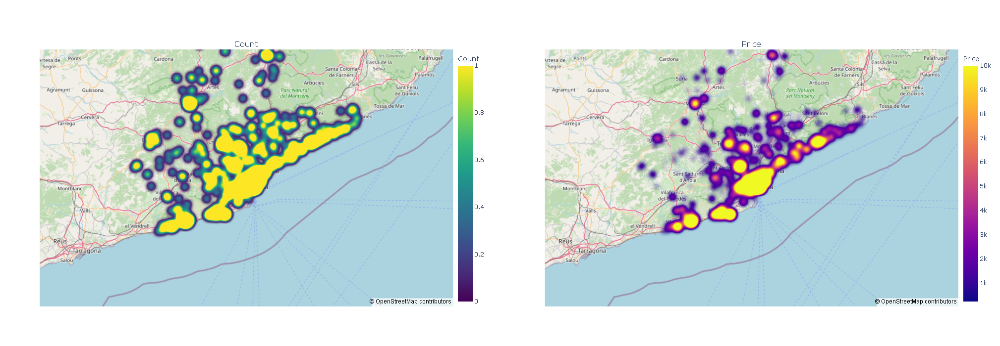

In [10]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Count", "Price"))

for trace_c in fig_count.data:
    trace_c['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace_c, row=1, col=1)

for trace_p in fig_price.data:
    trace_p['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace_p, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Viridis', colorbar=dict(title="Count", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Price", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

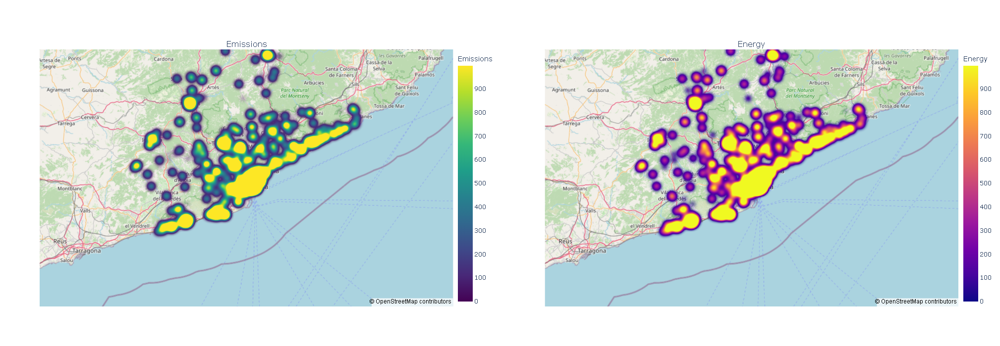

In [11]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Emissions", "Energy"))

for trace in fig_emissions.data:
    trace['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace, row=1, col=1)

for trace in fig_energy.data:
    trace['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Viridis', colorbar=dict(title="Emissions", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Energy", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df_geo.Latitude.mean(), 
                                    lon=df_geo.Longitude.mean()))

fig.show()

C:\Users\jcf\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning:

Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.



<Axes: >

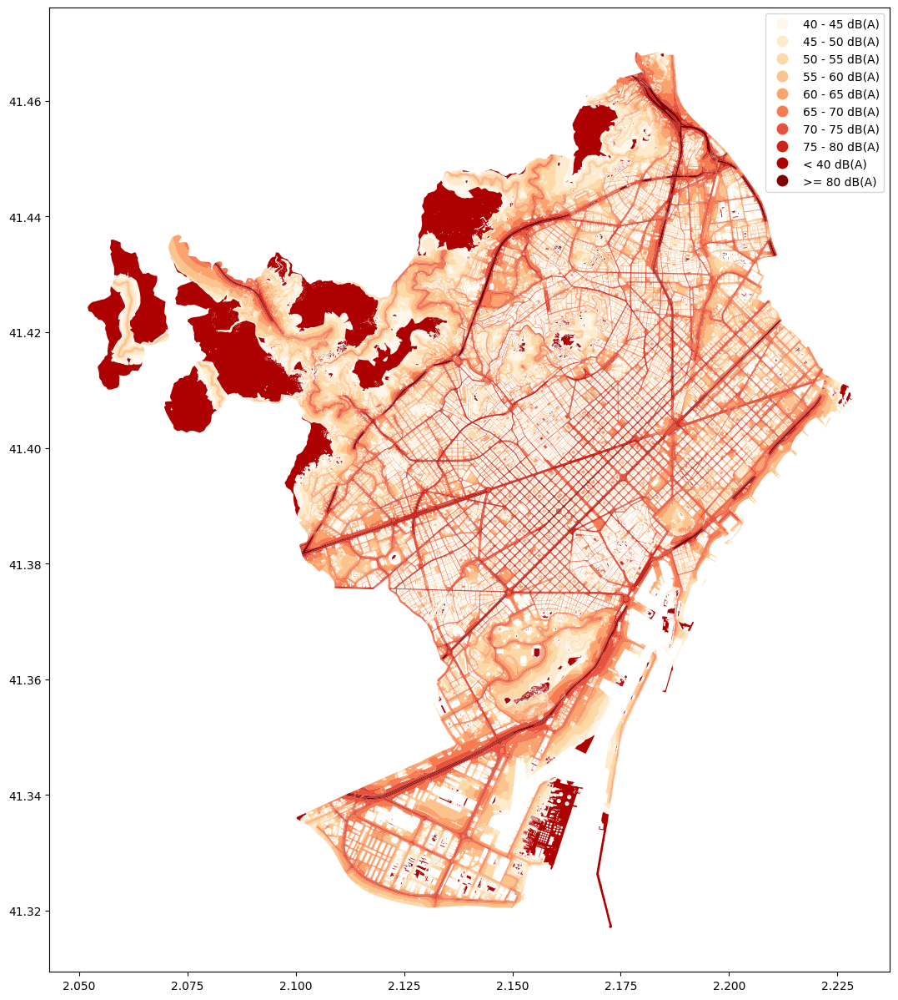

In [12]:
loudness_df.plot(column="loudness", legend=True, figsize=(20, 10), cmap='OrRd')